## Gyakorló feladatok megoldás

Az alábbi gyakorló feladatok a vizsgára való felkészülést hivatottak segíteni. Kiemelten (de nem kizárólagosan) kezeli az utolsó 2 hét anyagrészeit, mivel azokból nem volt félévközi számonkérés. Ettől függetlenül a vizsgában továbbra is szerepelhetnek kérdések a teljes félév bármely anyagrészére vonatkozóan, az továbbra is lefedi a teljes félév anyagát.

In [1]:
#Az alábbi modulok hasznosak lehetnek
import networkx as nx
import matplotlib.pyplot as plt
import random as rd
from pulp import *

In [2]:
#Hozzárendelési feladat
exec(open("ExamGraph.py", encoding="utf-8").read())
ExamGraph("1")


1. Egy vállalatnak van 4 gépe, melyekkel 4 különböző terméket tud gyártani.
Mindegyik gép minden termék gyártására alkalmas, de a beállítás miatt gépenként csak 1 adott termékre.
A gyártás során egy gép egy termékből előállít bizonyos mennyiséget, mely termék értékesítéséből a vállalat bevételre tesz szert.
Az alábbi táblázat mutatja, hogy az egyes gépek az egyes termékek esetén mekkora mennyiséget tudnak előállítani.

     G1  G2  G3  G4
T1  17  16  22  13
T2  16  24  19  19
T3  28  13  20   8
T4  11  16  25  19

a) Határozzunk meg egy gyártási tervet, mely maximalizálja az előállított termékek mennyiségét! Mennyi össz. terméket állít elő a vállalat, és melyik gép melyik termék gyártását végzi?

b) A termékek értékesítési árai az alábbiak: [11, 9, 10, 11]
Hogyan változik a megoldás, ha a vállalat már a maximális árbevétel szerint osztja be a gépeket a termékek előállítására?

c) Tegyük fel, hogy a vállalatnak van lehetősége egy 5. gépet is beszerezni, mely a 4 termékből az alábbi men

In [11]:
#a)
A=[[17, 16, 22, 13],
[16, 24, 19, 19],
[28, 13, 20, 8],
[11, 16, 25, 19]]

hozzarendeles = pulp.LpProblem('hozzarendeles_a', LpMaximize)

x = LpVariable.dicts('x',[(i,j) for i in range(4) for j in range(4)], lowBound = 0, cat="Continuous")

hozzarendeles += lpSum(A[i][j]*x[i,j] for i in range(4) for j in range(4))

for i in range(4):
    hozzarendeles += lpSum(x[i,j] for j in range(4)) == 1

for j in range(4):
    hozzarendeles += lpSum(x[i,j] for i in range(4)) == 1

megoldas = hozzarendeles.solve()

print(LpStatus[megoldas])
if LpStatus[megoldas] == 'Optimal':
    print('Maximális hozzárendelés össz. értéke: z* = ', value(hozzarendeles.objective))
    for i in range(4):
        for j in range(4):
            if x[i,j].varValue > 0:
                print ('T'+str(i+1)+" termékből "+str(A[i][j])+" darabot a G"+str(j+1)+" gép gyárt")

Optimal
Maximális hozzárendelés össz. értéke: z* =  93.0
T1 termékből 22 darabot a G3 gép gyárt
T2 termékből 24 darabot a G2 gép gyárt
T3 termékből 28 darabot a G1 gép gyárt
T4 termékből 19 darabot a G4 gép gyárt


In [15]:
#b)
ar = [11, 9, 10, 11]

hozzarendeles += lpSum(A[i][j]*ar[i]*x[i,j] for i in range(4) for j in range(4))

megoldas = hozzarendeles.solve()

print(LpStatus[megoldas])
if LpStatus[megoldas] == 'Optimal':
    print('Maximális hozzárendelés össz. értéke: z* = ', value(hozzarendeles.objective))
    for i in range(4):
        for j in range(4):
            if x[i,j].varValue > 0:
                print ('T'+str(i+1)+" termékből "+str(A[i][j])+" darabot a G"+str(j+1)+" gép gyárt " +str(A[i][j]*ar[i])+" értékben")

Optimal
Maximális hozzárendelés össz. értéke: z* =  947.0
T1 termékből 22 darabot a G3 gép gyárt 242 értékben
T2 termékből 24 darabot a G2 gép gyárt 216 értékben
T3 termékből 28 darabot a G1 gép gyárt 280 értékben
T4 termékből 19 darabot a G4 gép gyárt 209 értékben


In [16]:
#c)
b_opt = value(hozzarendeles.objective)
A=[[17, 16, 22, 13, 21],
[16, 24, 19, 19, 21],
[28, 13, 20, 8, 16],
[11, 16, 25, 19, 23]]

hozzarendeles = pulp.LpProblem('hozzarendeles', LpMaximize)

x = LpVariable.dicts('x',[(i,j) for i in range(4) for j in range(5)], lowBound = 0, cat="Binary")

hozzarendeles += lpSum(A[i][j]*ar[i]*x[i,j] for i in range(4) for j in range(5))

for i in range(4):
    hozzarendeles += lpSum(x[i,j] for j in range(5)) == 1

for j in range(5):
    hozzarendeles += lpSum(x[i,j] for i in range(4)) <= 1

megoldas = hozzarendeles.solve()

print(LpStatus[megoldas])
if LpStatus[megoldas] == 'Optimal':
    print('Maximális hozzárendelés össz. értéke: z* = ', value(hozzarendeles.objective))
    for i in range(4):
        for j in range(5):
            if x[i,j].varValue > 0:
                print ('T'+str(i+1)+" termékből "+str(A[i][j])+" darabot a G"+str(j+1)+" gép gyárt "+str(A[i][j]*ar[i])+" értékben")
print("A vállalat legfeljebb "+str(value(hozzarendeles.objective) - b_opt)+"-t hajlandó fizetni az 5. gépért")

Optimal
Maximális hozzárendelés össz. értéke: z* =  1002.0
T1 termékből 21 darabot a G5 gép gyárt 231 értékben
T2 termékből 24 darabot a G2 gép gyárt 216 értékben
T3 termékből 28 darabot a G1 gép gyárt 280 értékben
T4 termékből 25 darabot a G3 gép gyárt 275 értékben
A vállalat legfeljebb 55.0-t hajlandó fizetni az 5. gépért


In [3]:
#Stabil párosítás
exec(open("ExamGraph.py", encoding="utf-8").read())
ExamGraph("2")


2. Négy frissen végzett orvostanhallgató jelentkezik a rezidens gyakornoki programba, ahol négy kórházban keresnek 1-1 gyakornokot.
A hallgatók rendelkeznek preferenciákkal a kórházi helyek között.
(1-es a leginkább, 4-es a legkevésbé preferált)

Hallgató preferenciák  1. hallgató  2. hallgató  3. hallgató  4. hallgató
1. kórház                        4            2            1            2
2. kórház                        1            3            4            4
3. kórház                        3            4            2            1
4. kórház                        2            1            3            3

Hasonlóan a kórházak is rendelkeznek preferenciákkal az egyes hallgatók között.
(1-es a leginkább, 4-es a legkevésbé preferált)

Kórház preferenciák  1. hallgató  2. hallgató  3. hallgató  4. hallgató
1. kórház                      2            3            4            1
2. kórház                      2            1            4            3
3. kórház                      3    

In [26]:
#a)
P=[[4,2,1,2],
   [1,3,4,4],
   [3,4,2,1],
   [2,1,3,4]]
Q=[[2,3,4,1],
   [2,1,4,3],
   [3,4,1,2],
   [3,4,2,1]]

korhazak = [1,2,3,4]
hallgatok = [1,2,3,4]

stabil_par = LpProblem('stabil_parositas', LpMinimize)

x = LpVariable.dicts('x',[(i,j) for i in korhazak for j in hallgatok], lowBound = 0, cat="Continuous")

stabil_par += lpSum(P[i-1][j-1]*x[i,j] for i in korhazak for j in hallgatok)

for i in korhazak:
    stabil_par += lpSum(x[i,j] for j in hallgatok) == 1

for j in hallgatok:
    stabil_par += lpSum(x[i,j] for i in korhazak) == 1

for i in korhazak:
    for j in hallgatok:
        stabil_par += x[i,j] + lpSum(x[i,k] for k in hallgatok if P[i-1][k-1] < P[i-1][j-1]) + lpSum(x[l,j] for l in korhazak if Q[l-1][j-1] < Q[i-1][j-1]) >= 1

megoldas = stabil_par.solve()
if LpStatus[megoldas] == 'Optimal':
    print('Stabil párosítás össz. preferenciái: z* = ', value(stabil_par.objective))
    for i in korhazak:
        for j in hallgatok:
            if (x[i,j].varValue == 1):
                print(str(j)+". hallgató párja a "+str(i)+". kórház")

Stabil párosítás össz. preferenciái: z* =  4.0
3. hallgató párja a 1. kórház
1. hallgató párja a 2. kórház
4. hallgató párja a 3. kórház
2. hallgató párja a 4. kórház


In [28]:
#b)
stabil_par = LpProblem('stabil_parositas', LpMaximize)

x = LpVariable.dicts('x',[(i,j) for i in korhazak for j in hallgatok], lowBound = 0, cat="Continuous")

stabil_par += lpSum(Q[i-1][j-1]*x[i,j] for i in korhazak for j in hallgatok)

for i in korhazak:
    stabil_par += lpSum(x[i,j] for j in hallgatok) == 1

for j in hallgatok:
    stabil_par += lpSum(x[i,j] for i in korhazak) == 1

for i in korhazak:
    for j in hallgatok:
        stabil_par += x[i,j] + lpSum(x[i,k] for k in hallgatok if P[i-1][k-1] < P[i-1][j-1]) + lpSum(x[l,j] for l in korhazak if Q[l-1][j-1] > Q[i-1][j-1]) >= 1

megoldas = stabil_par.solve()
if LpStatus[megoldas] == 'Optimal':
    print('Stabil párosítás össz. preferenciái: z* = ', 16-value(stabil_par.objective))
    for i in korhazak:
        for j in hallgatok:
            if (x[i,j].varValue == 1):
                print(str(j)+". hallgató párja a "+str(i)+". kórház")

Stabil párosítás össz. preferenciái: z* =  4.0
3. hallgató párja a 1. kórház
1. hallgató párja a 2. kórház
4. hallgató párja a 3. kórház
2. hallgató párja a 4. kórház


In [17]:
#12. gyakorlat feladatai
exec(open("ExamGraph.py", encoding="utf-8").read())
ExamGraph("3")
L = nx.read_edgelist("lastfm_asia_edges.csv", nodetype=int, delimiter=";")


3/1. Színezzük ki a Last FM Asia gráf éleit. Ha egy él mindkét csúcsának azonosító száma kisebb mint 4000, akkor legyen az él színe 'magenta', ellenkező esetben legyen a színe 'navy'.

3/2. Mekkorának kell válasszuk egy 110 csúcsú Erdős-Rényi gráf 'p' paraméterét, hogy várhatóan ugyanannyi csúcsunk legyen, mint egy (n=110, m=6) paraméterekkel rendelkező Barabási-Albert gráfnak?

3/3. Teszteljük szimulációval, hogy egy (n=200,m=4) paraméterezéső Barabási-Albert és egy (megközelítőleg) azonos csúcs- és élszámú Erdős-Rényi hálózatok esetén melyik gráftípusban nagyobb a rövidutak átlagos hossza.

3/4. Irányítsuk meg a korvett gráf éleit mindkét irányba és számoljuk ki a csúcsok pagerank értékeit 0.85-ös párologtatási paraméter mellett egy LP segítségével!

3/5. Szimuláció segítségével vizsgáljuk meg, hogy a top 10 pagerank csúcs (alpha=0.8) melyik gráftípusban ér el több csúcsot a független kaszkád terjedési mechanizmuson keresztül, az (n=120,m=8) paraméterezésű Barabási-Albert gráf, vagy

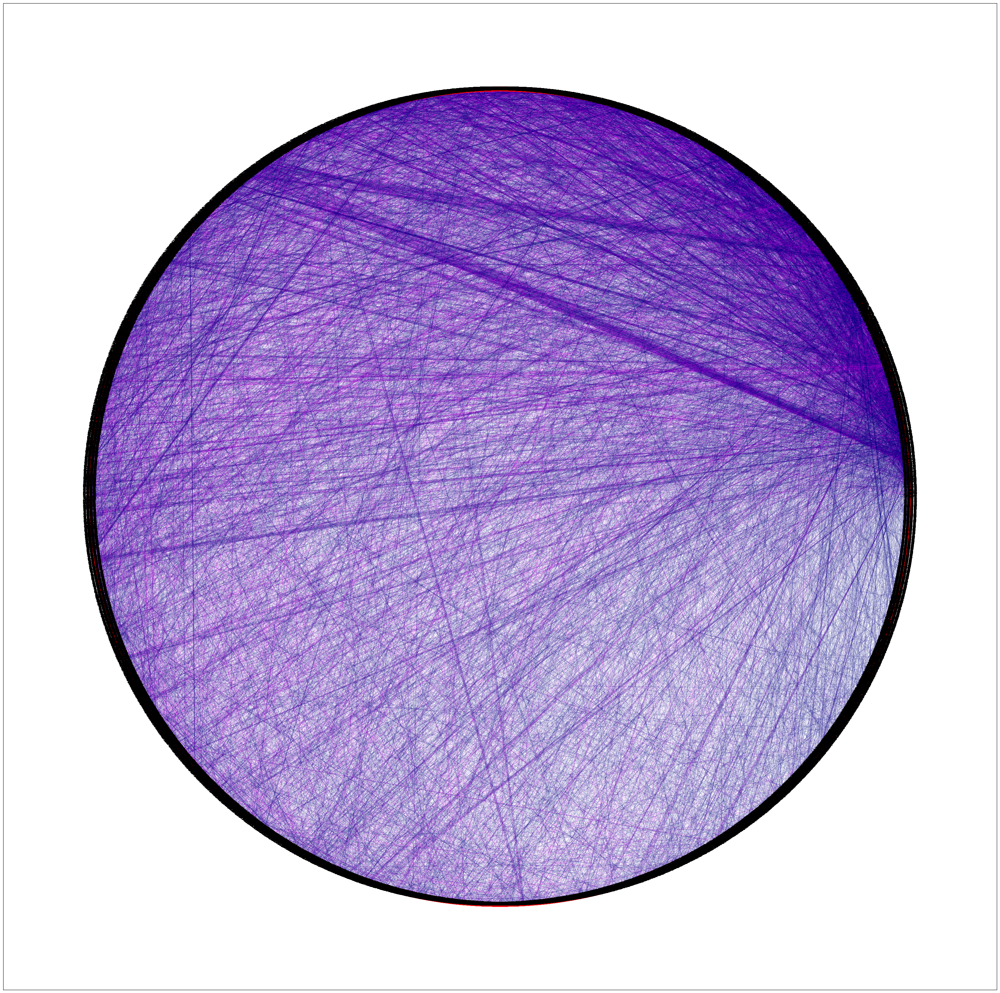

In [18]:
#3/1.
colors=[]
for u,v in L.edges():
    if u < 4000 and v < 4000:
        colors.append('magenta')
    else:
        colors.append('navy')

import matplotlib.pyplot as plt 
fig = plt.figure(figsize=(40, 40))
pos = nx.circular_layout(L)

nx.draw_networkx(L, pos, node_size=100, width=0.1, node_color='red', edge_color = colors)

In [ ]:
#3/2.

#Egy (n=110, m=6) paraméterezésű B-A gráfnak 104*6=624 csúcsa van. Egy 110 csúcsú egyszerű gráfnak 110*109/2=5995 lehetséges éle van. 
#Így nagyjából p értékét 624/5995=0.104-nek kell választani.

In [22]:
#3/3.
sim_length = 100

barab_res = []
erdos_res = []
for i in range(sim_length):
    B = nx.barabasi_albert_graph(200, 4, seed=rd.randint(1,10000))
    E = nx.erdos_renyi_graph(200, 0.03939, seed=rd.randint(1,10000))
    if nx.is_connected(B) == False or nx.is_connected(E) == False:
        continue
    else: 
        barab_res.append(nx.average_shortest_path_length(B))
        erdos_res.append(nx.average_shortest_path_length(E))

print("Rövidutak átlagos hossza a B-A gráftípusban: ", sum(barab_res) / sim_length)
print("Rövidutak átlagos hossza az E-R gráftípusban: ", sum(erdos_res) / sim_length)

Rövidutak átlagos hossza a B-A gráftípusban:  2.3917447236180904
Rövidutak átlagos hossza az E-R gráftípusban:  2.5435502512562813


In [23]:
#3/4.
import numpy as np
G = nx.Graph()
G.add_nodes_from(range(1,16))
G.add_edge(1, 4)
G.add_edge(2, 5)
G.add_edge(3, 6)
G.add_edge(4, 7)
G.add_edge(5, 7)
G.add_edge(6, 7)
G.add_edge(7, 8)
G.add_edge(8, 9)
G.add_edge(9, 10)
G.add_edge(10, 11)
G.add_edge(10, 12)
G.add_edge(10, 13)
G.add_edge(10, 14)
G.add_edge(10, 15)

G2 = G.to_directed()

M=nx.adjacency_matrix(G2)
T=M.toarray()
T=T.astype(float)
#Minden sorban elvégezzük a normalizálást
for i in range(len(T[0])):
    rowsum=0
    #Először végigmegünk az i. soron. A rowsum változó mutatja, hogy hány ki-éle van a csúcsnak.
    for j in range(len(T[0])):
        rowsum=rowsum+T[i][j]
    
    #Ha van ki-éle a csúcsnak, akkor normalizálunk a rowsum értékkel, ha nincs akkor beállítjuk a cella értékét 1/n-re
    for j in range(len(T[0])):
        if rowsum != 0:
            T[i][j]=T[i][j]/rowsum
        else:
            T[i][j]=1/len(T[0])  

T=np.transpose(T)
T=0.85*T+0.15/len(T[0])

from pulp import *
PageRank = pulp.LpProblem('PageRank', LpMaximize)
x = LpVariable.dicts('x',[i for i in range(len(T[0]))], lowBound = 0, cat="Continuous")

PageRank += x[0]

for i in range(len(T[0])):
    PageRank += lpSum(T[i][j]*x[j] for j in range(len(T[0]))) + lpSum(-x[i])== 0
    
PageRank += lpSum(x[j] for j in range(len(T[0]))) == 1

megoldas = PageRank.solve()    
    
print(LpStatus[megoldas])
if LpStatus[megoldas] == 'Optimal':
    print("A csúcsok PageRank értékei")
    for i in range(len(T[0])):
        print ("x_",(i), "=", x[i].varValue)
        
print("Ellenőrzés\n", nx.pagerank(G2, alpha=0.85))

Optimal
A csúcsok PageRank értékei
x_ 0 = 0.040732965
x_ 1 = 0.040732965
x_ 2 = 0.040732965
x_ 3 = 0.072312859
x_ 4 = 0.072312859
x_ 5 = 0.072312859
x_ 6 = 0.13030512
x_ 7 = 0.0661323
x_ 8 = 0.066923439
x_ 9 = 0.20341561
x_ 10 = 0.038817211
x_ 11 = 0.038817211
x_ 12 = 0.038817211
x_ 13 = 0.038817211
x_ 14 = 0.038817211
Ellenőrzés
 {1: 0.04073319792778762, 2: 0.04073319792778762, 3: 0.04073319792778762, 4: 0.07231239214431734, 5: 0.07231239214431734, 6: 0.07231239214431734, 7: 0.13030606006555148, 8: 0.06613182245085023, 9: 0.06692392574143177, 10: 0.20341412422963587, 11: 0.038817459459243156, 12: 0.038817459459243156, 13: 0.038817459459243156, 14: 0.038817459459243156, 15: 0.038817459459243156}


In [24]:
#3/5
def independent_cascade(G, seed):
    import networkx as nx
    import random as rd
    
    #Ha a hálózat nem irányított, akkor azzá alakítjuk mert nem biztos, hogy minden (x,y) barátságra igaz, 
    #hogy x befolyása y-ra ugyanakkora, mint y befolyása x-re
    if nx.is_directed(G) == False:
        G=nx.to_directed(G)
    
    #Létrehozunk egy 'active' tulajdonságot minden csúcsra. 
    for i in G.nodes():
        G.nodes[i]['active']=False
    
    #Kedzetben csak a seed halmazhoz tartozó csúcsok aktívak.
    for i in seed:
        G.nodes[i]['active']=True
    
    #Minden él kap egy befolyásolási valószínűséget 1 és 10% között
    for i, j in G.edges():
        G[i][j]['propagation_prob']=rd.uniform(0.01,0.1)
    
    #Az aktív csúcsok megpróbálják befolyásolni a szomszédaikat. A sikeresen befolyásolt csúcsokon iteráljuk az eljárást.
    currently_spreading = seed.copy()
    
    #Az aktív halmazban gyűjtjük az összes csúcsot, akit sikerült aktíválni. Kezdetben ez a halmaz is a seed-del egyenlő.
    active_set = seed.copy()
    
    while len(currently_spreading) > 0:
        
        newly_activated=set()
        
        for i in currently_spreading:
            for i, j in G.out_edges(i):
                if G.nodes[j]['active']==False:
                    if rd.uniform(0,1) < G[i][j]['propagation_prob']:
                        newly_activated.add(j)
                        G.nodes[j]['active']=True
        
        currently_spreading=newly_activated
        
        #Az aktív halmazt frissítjük az újonnan aktivált csúcsokkal
        active_set.update(newly_activated)
    
    return active_set

In [25]:
#3/5. folyt.

import random as rd

#szimuláció hossza (ha nem konvergál válasszuk nagyobbnak)
sim_length = 100

#ezekben tároljuk az eredményt
barab_res = []
erdos_res = []

#szimuláció kezdete
for i in range(sim_length):
    #véletlen gráfog generálása
    B = nx.barabasi_albert_graph(200, 4, seed=rd.randint(1,10000))
    E = nx.erdos_renyi_graph(200, 0.03939, seed=rd.randint(1,10000))

    #top 10 pagerank csúcs kiszámítása
    pr_b = nx.pagerank(B, alpha=0.85)
    pr_b_sorted = sorted(pr_b.items(), key = lambda item: item[1], reverse=True)
    seed_pr_b = set()
    for i in range(10):
        seed_pr_b.add(pr_b_sorted[i][0])

    pr_e = nx.pagerank(E, alpha=0.85)
    pr_e_sorted = sorted(pr_e.items(), key = lambda item: item[1], reverse=True)
    seed_pr_e = set()
    for i in range(10):
        seed_pr_e.add(pr_e_sorted[i][0])
        
    barab_res.append(len(independent_cascade(B, seed_pr_b)))
    erdos_res.append(len(independent_cascade(E, seed_pr_e)))

print("Független kaszkád átlagos nagysága a B-A gráftípusban: ", sum(barab_res) / sim_length)
print("Független kaszkád átlagos nagysága az E-R gráftípusban: ", sum(erdos_res) / sim_length)


Független kaszkád átlagos nagysága a B-A gráftípusban:  29.42
Független kaszkád átlagos nagysága az E-R gráftípusban:  20.74


Kérem adja meg a NEPTUN kódját, majd üssön ENTER-t! anhkcw


4.a) Számítsa ki a H gráf minimális súlyú feszítő fáját! Mekkora a fa összköltsége és milyen élek alkotják?
b) Irányítsa meg a gráf éleit a legnagyobb sorszámú csúcstól a legkisebb sorszámú csúcsba! Tegyük fel, hogy az élsúlyok az éleken való áthaladás idejét jelképezik. Írjon fel egy LP feladatot, amely kiszámolja a legrövidebb utat a 12-es csúcsból az 1-es csúcsba. Mennyi idő alatt lehet átjutni? Milyen éleken halad keresztül a legrövidebb út?
c) Színezze kékre ('blue') azokat az éleket, amelyek a 12-es csúcsból indított szélességi keresés első 9 éléhez tartoznak, pirosra ('red') azokat, amelyek a legrövidebb úton vannak rajta és magentával ('magenta'), amelyek mindkettőn megtalálhatóak, a többi él maradjon fekete. Ábrázolja a gráfot!


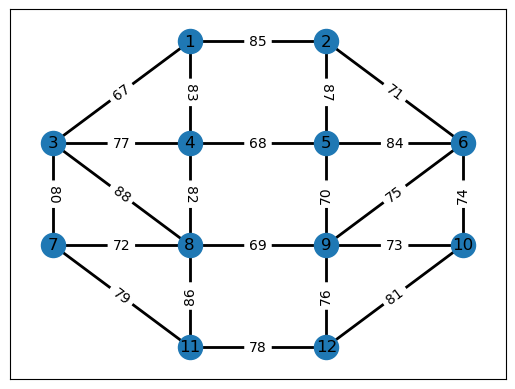

In [5]:
#MCST, LRU LP, BFS színezés
exec(open("ExamGraph.py", encoding="utf-8").read())
posH, H = ExamGraph("4")

In [7]:
#a) 
MCST=nx.minimum_spanning_tree(H, algorithm='kruskal')
ossz_suly = 0
print('a) A feszítőfa élei:')
for i,j in MCST.edges():
    ossz_suly += MCST[i][j]["weight"]
    print('('+str(i)+','+str(j)+')')
print('A feszítőfa össz. súlya:', ossz_suly)

a) A feszítőfa élei:
(1,3)
(2,6)
(3,4)
(7,8)
(11,12)
(12,9)
(10,9)
(10,6)
(4,5)
(9,8)
(9,5)
A feszítőfa össz. súlya: 795


In [8]:
#b)
I = nx.DiGraph()
for i,j in H.edges():
    if i > j:
        I.add_edge(i,j,weight = H[i][j]["weight"])
    if i < j:
        I.add_edge(j,i,weight = H[j][i]["weight"])

rovidut_LP = pulp.LpProblem('Legrövidebb_út', LpMaximize)

x = LpVariable.dicts('x',[v for v in I.nodes()],lowBound = 0, cat="Continuous")

rovidut_LP += x[1]

d = nx.get_edge_attributes(I, 'weight')
elek = list(I.edges())

for i in range(len(elek)):
    rovidut_LP += x[elek[i][1]] - x[elek[i][0]] <= d[elek[i][0], elek[i][1]]

rovidut_LP += x[12] == 0

megoldas = rovidut_LP.solve()

print(LpStatus[megoldas])
print('b) Legrövidebb út hossza: z* = ', value(rovidut_LP.objective))
print('A legrövidebb út élei:')
i=0
lru_elek = []
for name, c in rovidut_LP.constraints.items():
    if c.pi == 1:
        print(str(elek[i]))
        lru_elek.append(elek[i])
    i += 1
    if (i == len(elek)):
        break

Optimal
b) Legrövidebb út hossza: z* =  297.0
A legrövidebb út élei:
(4, 1)
(5, 4)
(12, 9)
(9, 5)


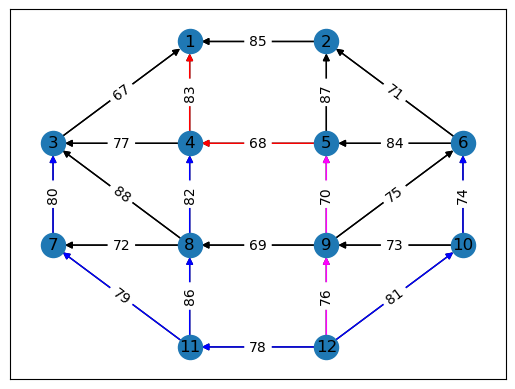

In [9]:
#c)
bfs_elek = [edges for edges in nx.bfs_edges(I, 12)]
for i,j in I.edges():
    I[i][j]["color"] = "black"
for i,j in bfs_elek[0:9]:
    I[i][j]["color"] = "blue"
for k in range(len(lru_elek)):
    I[lru_elek[k][0]][lru_elek[k][1]]["color"] = "red"
    for i,j in bfs_elek[0:9]:
        if i == lru_elek[k][0] and j == lru_elek[k][1]:
            I[i][j]["color"] = "magenta"
            break
colors = [I[u][v]["color"] for u,v in I.edges()]

nx.draw_networkx(I, posH)
nx.draw_networkx_edges(I,posH, edge_color = colors)
edge_labels = nx.get_edge_attributes(I, "weight")
nx.draw_networkx_edge_labels(I,posH, edge_labels)
plt.show()